<a href="https://colab.research.google.com/github/aqilahassan-hub/Multi-domain-Endoscopic-Surgeon-Action-Detection/blob/main/UpdatedYoloV5(2.0).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install torch

In [3]:
import torch

In [4]:
from IPython.display import Image #this is to render predictions

In [5]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 10628, done.
remote: Total 10628 (delta 0), reused 0 (delta 0), pack-reused 10628
Receiving objects: 100% (10628/10628), 10.79 MiB | 33.80 MiB/s, done.
Resolving deltas: 100% (7344/7344), done.


In [6]:
%cd yolov5

/content/yolov5


In [7]:
!pip install -r requirements.txt

     |████████████████████████████████| 596 kB 7.7 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [8]:
import os
from random import choice
import shutil

#arrays to store file names
imgs =[]
xmls =[]

#setup dir names
trainPath = '/content/drive/MyDrive/CSE 499/yolo/Dataset/Images/Train'
valPath = '/content/drive/MyDrive/CSE 499/yolo/Dataset/Images/Val'
crsPath = '/content/drive/MyDrive/CSE 499/yolo/Dataset' #dir where images and annotations stored

#setup ratio (val ratio = rest of the files in origin dir after splitting into train and test)
train_ratio = 0.8
val_ratio = 0.2


#total count of imgs
totalImgCount = len(os.listdir(crsPath))/2

#soring files to corresponding arrays
for (dirname, dirs, files) in os.walk(crsPath):
    for filename in files:
        if filename.endswith('.txt'):
            xmls.append(filename)
        else:
            imgs.append(filename)


#counting range for cycles
countForTrain = int(len(imgs)*train_ratio)
countForVal = int(len(imgs)*val_ratio)
print("training images are : ",countForTrain)
print("Validation images are : ",countForVal)

training images are :  646
Validation images are :  161


In [10]:
!python train.py --img 416 --batch 16 --epochs 100 --data /content/yolov5/data/mesad.yaml  --weights yolov5s.pt  --cache


train: weights=yolov5s.pt, cfg=, data=/content/yolov5/data/mesad.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, transl

In [11]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

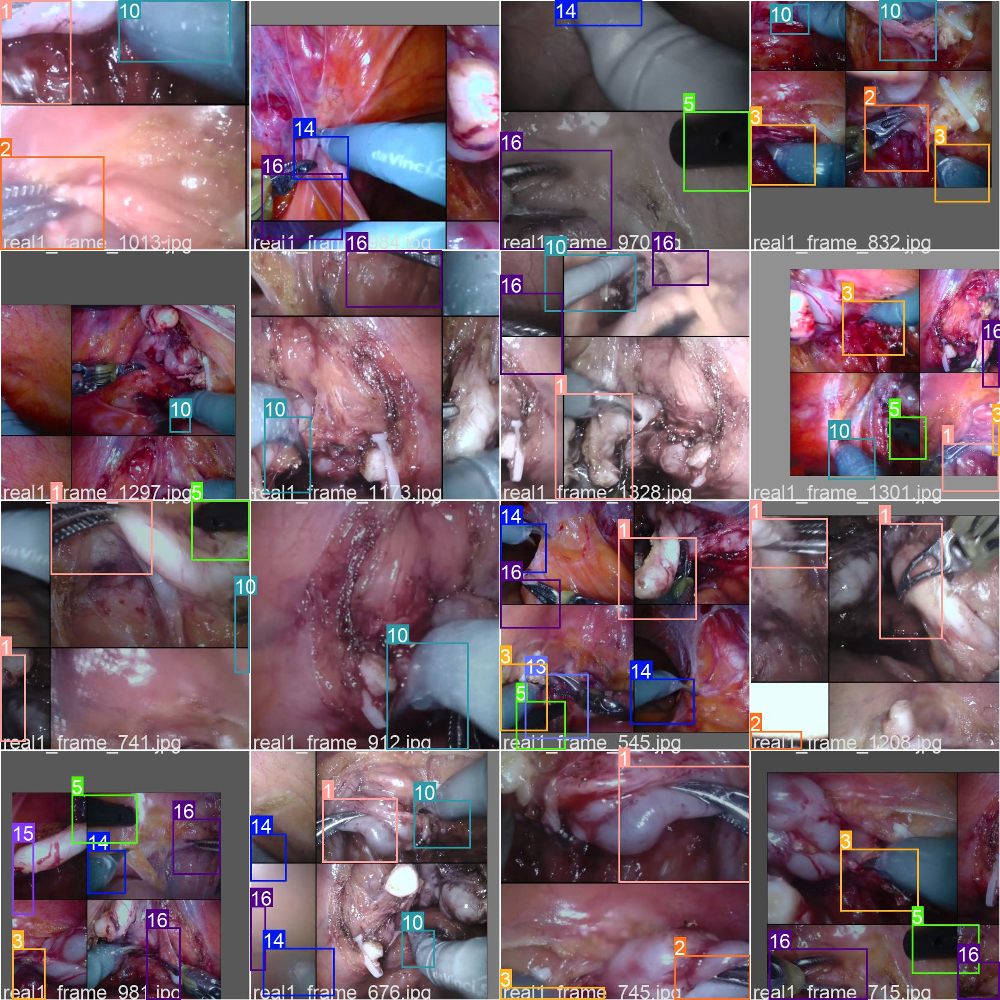

In [12]:
Image(filename='/content/yolov5/runs/train/exp/train_batch0.jpg', width=1000)

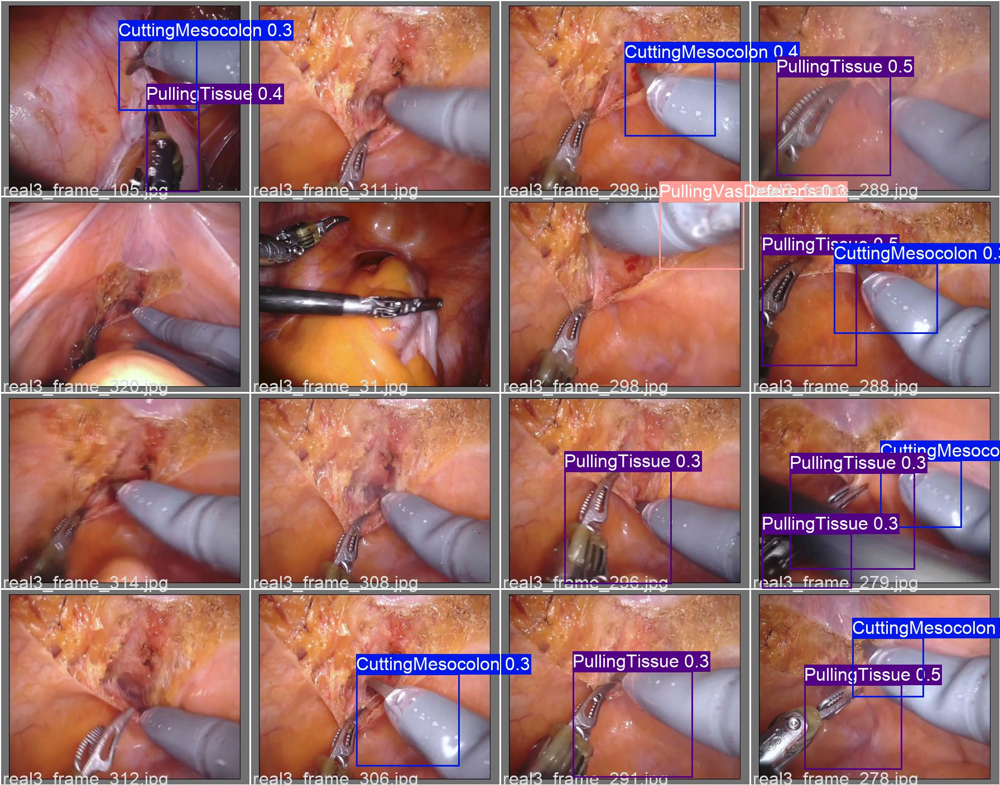

In [13]:
Image(filename='/content/yolov5/runs/train/exp/val_batch0_pred.jpg', width=1000)

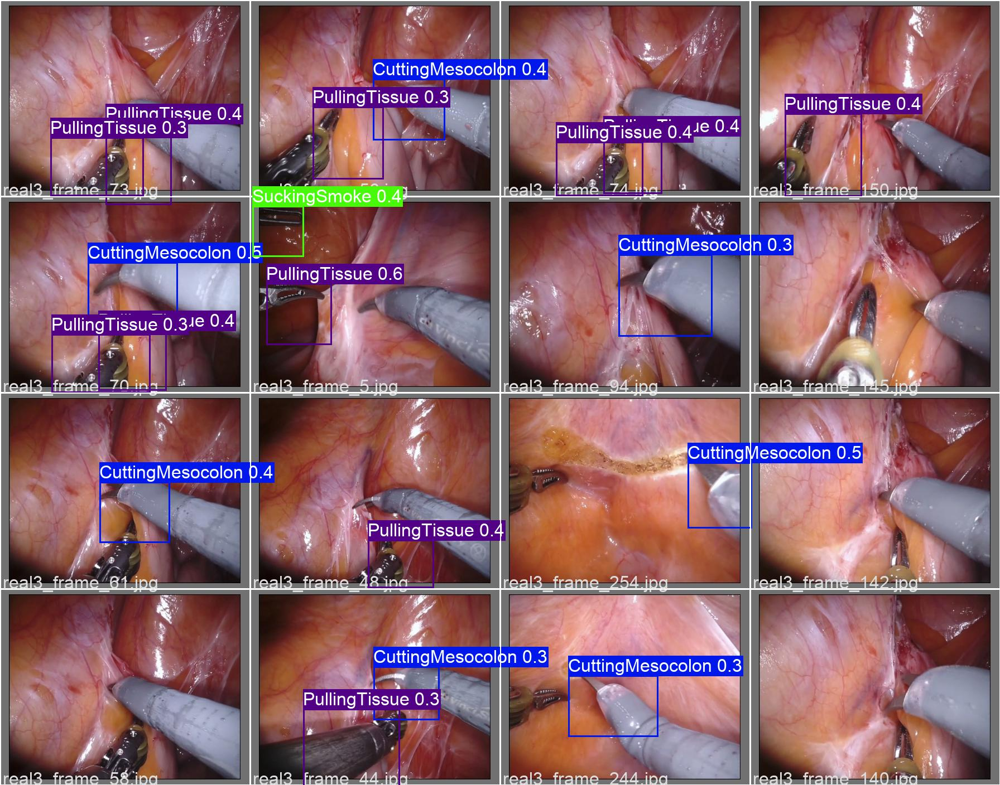

In [14]:
Image(filename='/content/yolov5/runs/train/exp/val_batch1_pred.jpg', width=1000)

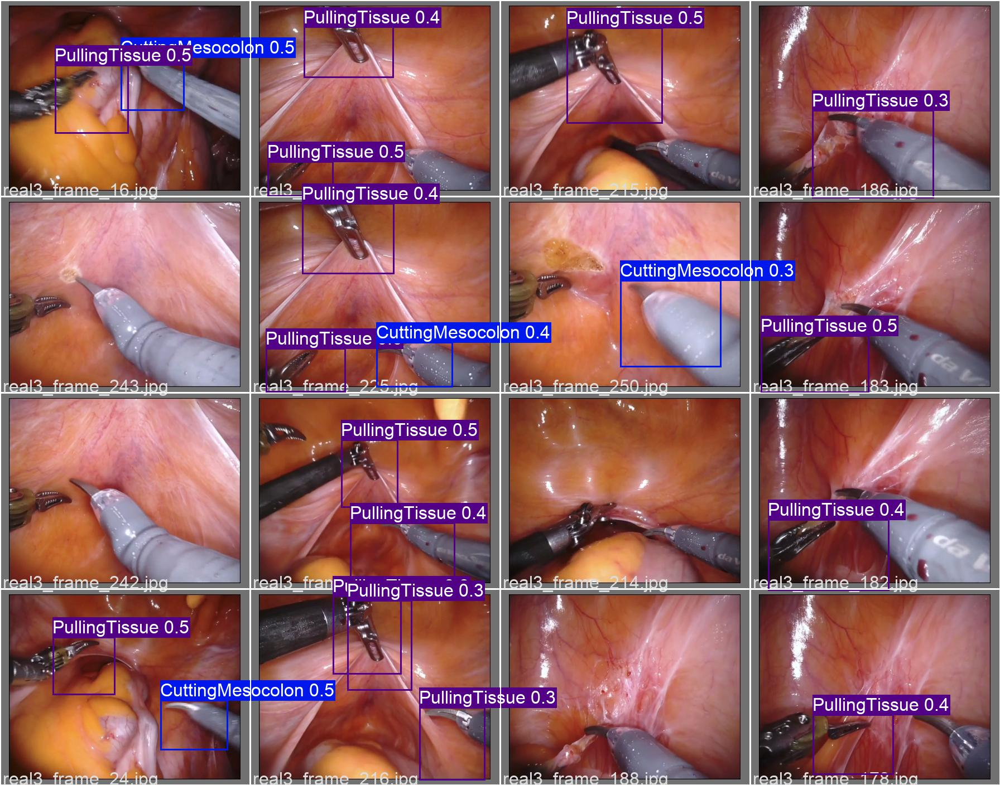

In [15]:
Image(filename='/content/yolov5/runs/train/exp/val_batch2_pred.jpg', width=1000)

In [16]:
!python detect.py --source /content/yolov5/runs/train/exp/real1_frame_2126.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/real1_frame_2126.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/real1_frame_2126.jpg: 512x640 1 PullingVasDeferens, Done. (0.021s)
Speed: 0.5ms pre-process, 20.9ms inference, 1.5ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


In [18]:
!python detect.py --source /content/yolov5/runs/train/exp/real1_frame_2127.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/real1_frame_2127.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/real1_frame_2127.jpg: 512x640 1 PullingVasDeferens, 1 PullingTissue, Done. (0.018s)
Speed: 0.5ms pre-process, 17.5ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp3


In [19]:
!python detect.py --source /content/yolov5/runs/train/exp/real1_frame_2128.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/real1_frame_2128.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/real1_frame_2128.jpg: 512x640 1 PullingVasDeferens, 1 PullingTissue, Done. (0.018s)
Speed: 0.5ms pre-process, 17.6ms inference, 1.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp4


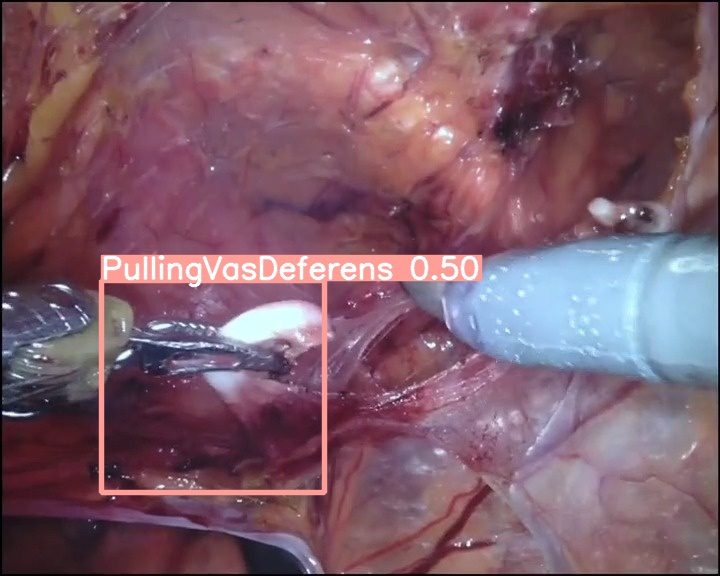

In [20]:
Image(filename='/content/yolov5/runs/detect/exp/real1_frame_2126.jpg', width=1000)

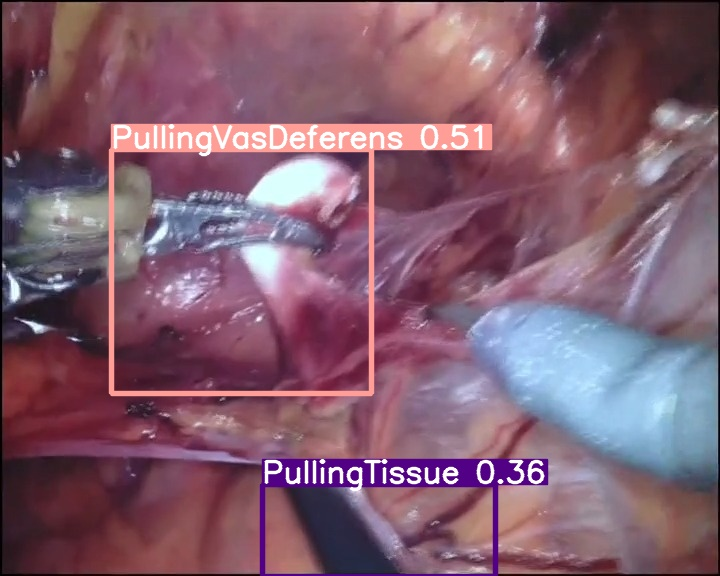

In [21]:
Image(filename='/content/yolov5/runs/detect/exp3/real1_frame_2127.jpg', width=1000)

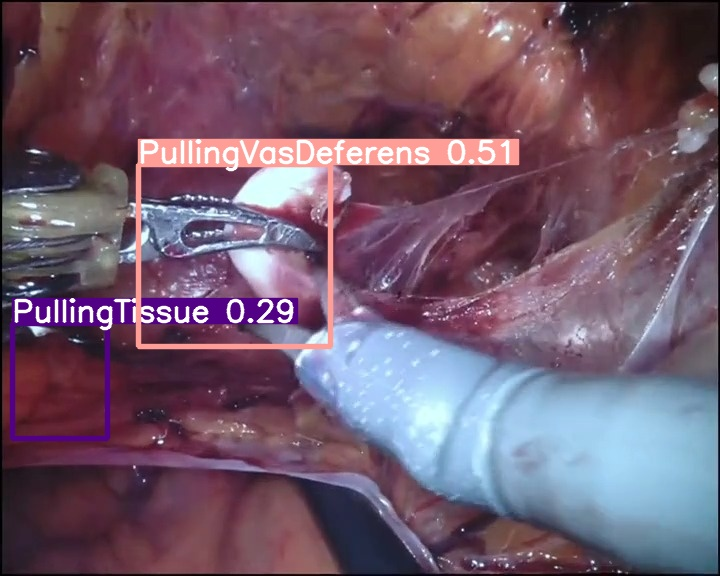

In [22]:
Image(filename='/content/yolov5/runs/detect/exp4/real1_frame_2128.jpg', width=1000)

In [23]:
!python detect.py --source /content/yolov5/runs/train/exp/real1_frame_3822.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/real1_frame_3822.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/real1_frame_3822.jpg: 512x640 1 PullingTissue, Done. (0.025s)
Speed: 0.5ms pre-process, 25.0ms inference, 1.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp5


In [24]:
!python detect.py --source /content/yolov5/runs/train/exp/real1_frame_3823.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/real1_frame_3823.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/real1_frame_3823.jpg: 512x640 Done. (0.018s)
Speed: 0.5ms pre-process, 17.6ms inference, 0.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp6


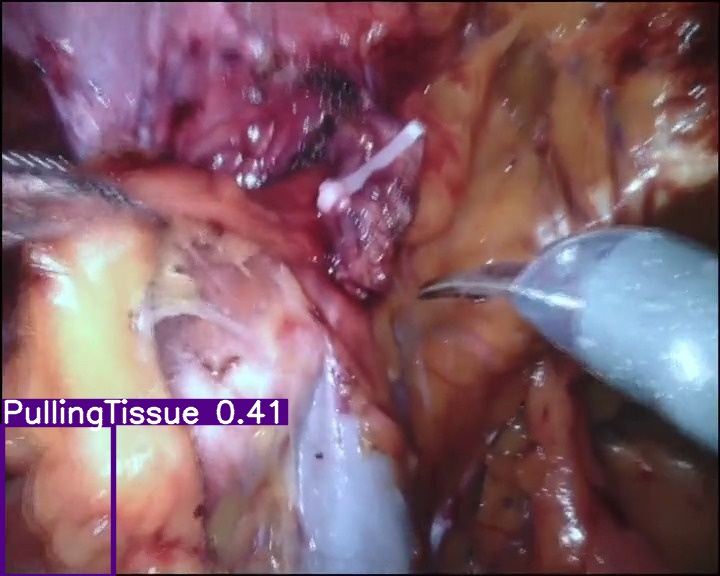

In [25]:
Image(filename='/content/yolov5/runs/detect/exp5/real1_frame_3822.jpg', width=1000)

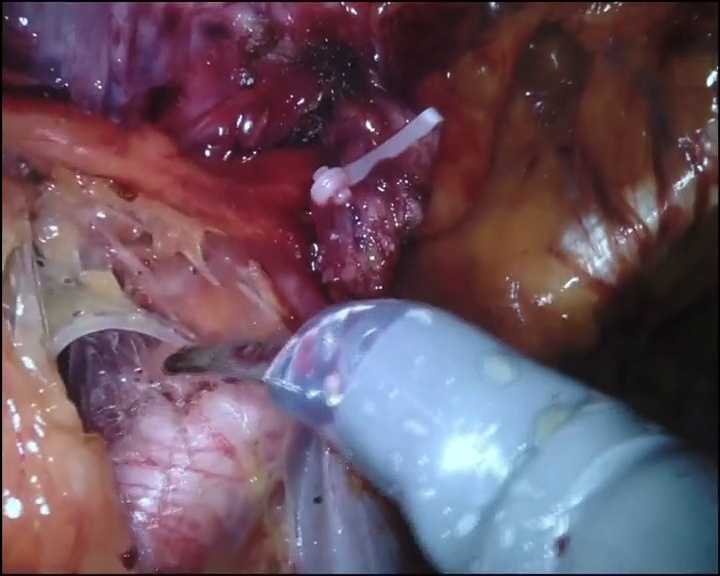

In [26]:
Image(filename='/content/yolov5/runs/detect/exp6/real1_frame_3823.jpg', width=1000)

In [27]:
!python detect.py --source /content/yolov5/runs/train/exp/real1_frame_1414.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/real1_frame_1414.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/real1_frame_1414.jpg: 512x640 1 PullingVasDeferens, 1 SuckingSmoke, Done. (0.018s)
Speed: 0.5ms pre-process, 17.6ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp7


In [28]:
!python detect.py --source /content/yolov5/runs/train/exp/real1_frame_1415.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/real1_frame_1415.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/real1_frame_1415.jpg: 512x640 1 PullingVasDeferens, Done. (0.017s)
Speed: 0.5ms pre-process, 17.2ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp8


In [29]:
!python detect.py --source /content/yolov5/runs/train/exp/real1_frame_1416.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/real1_frame_1416.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/real1_frame_1416.jpg: 512x640 1 PullingVasDeferens, Done. (0.017s)
Speed: 0.5ms pre-process, 17.5ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp9


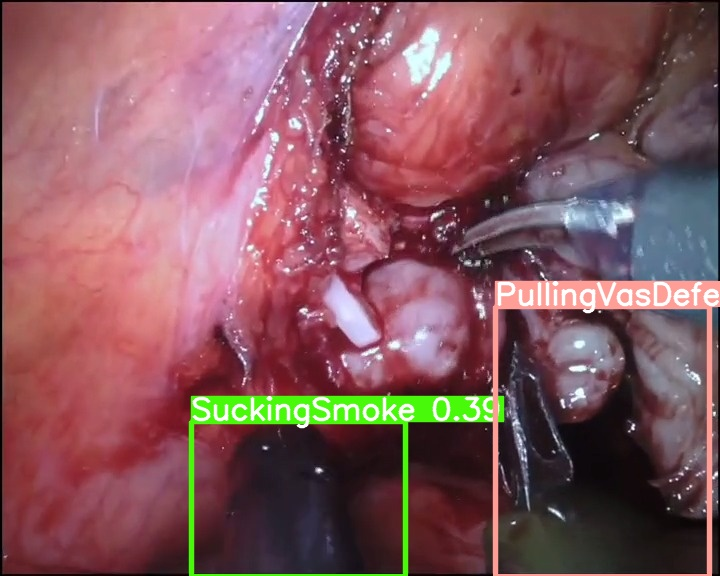

In [30]:
Image(filename='/content/yolov5/runs/detect/exp7/real1_frame_1414.jpg', width=1000)

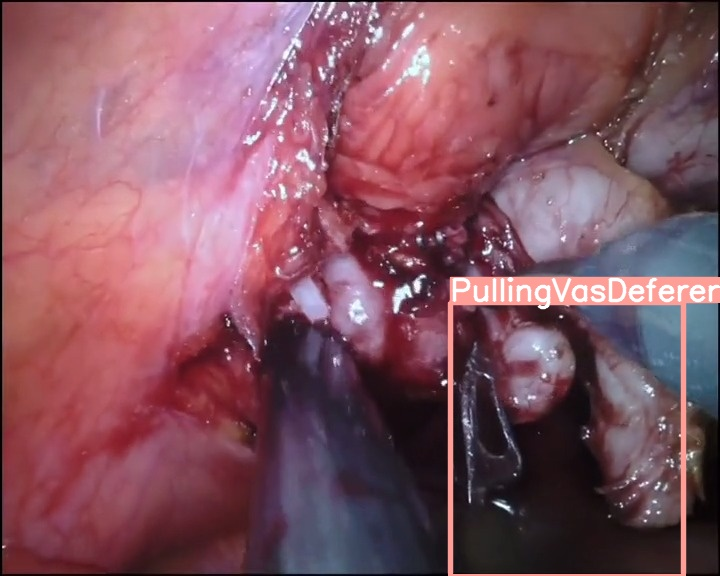

In [31]:
Image(filename='/content/yolov5/runs/detect/exp8/real1_frame_1415.jpg', width=1000)

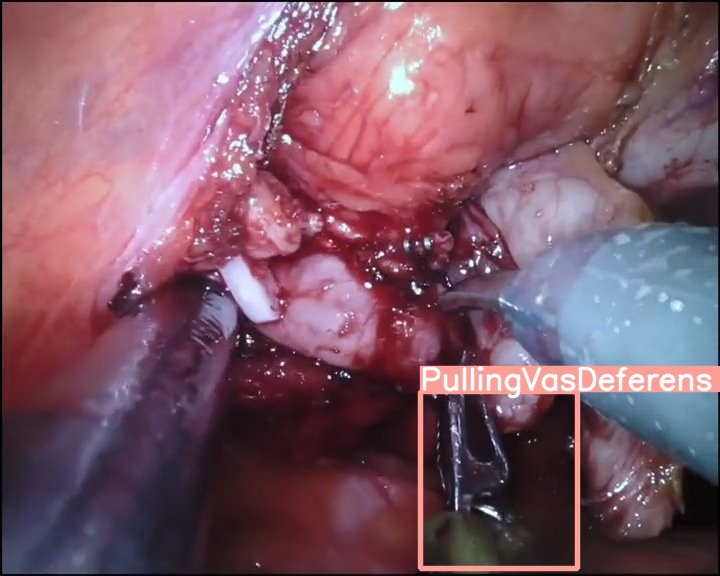

In [32]:
Image(filename='/content/yolov5/runs/detect/exp9/real1_frame_1416.jpg', width=1000)

In [33]:
!python detect.py --source /content/yolov5/runs/train/real3_frame_73.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/real3_frame_73.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/real3_frame_73.jpg: 512x640 2 PullingTissues, Done. (0.018s)
Speed: 0.5ms pre-process, 17.6ms inference, 1.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp10


In [34]:
!python detect.py --source /content/yolov5/runs/train/real3_frame_74.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/real3_frame_74.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/real3_frame_74.jpg: 512x640 2 PullingTissues, Done. (0.020s)
Speed: 0.6ms pre-process, 20.4ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp11


In [35]:
!python detect.py --source /content/yolov5/runs/train/real3_frame_75.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/real3_frame_75.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/real3_frame_75.jpg: 512x640 2 PullingTissues, Done. (0.018s)
Speed: 0.5ms pre-process, 18.0ms inference, 1.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp12


In [36]:
!python detect.py --source /content/yolov5/runs/train/real3_frame_76.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/real3_frame_76.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/real3_frame_76.jpg: 512x640 1 PullingTissue, Done. (0.019s)
Speed: 0.5ms pre-process, 19.2ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp13


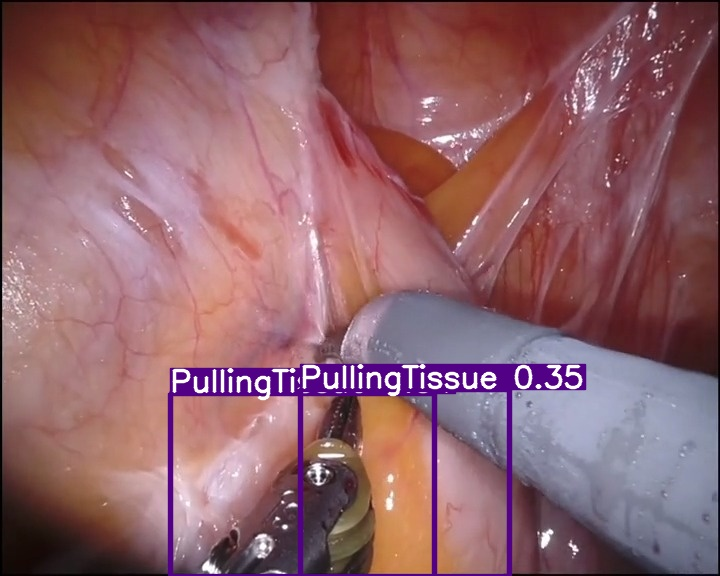

In [37]:
Image(filename='/content/yolov5/runs/detect/exp10/real3_frame_73.jpg', width=1000)

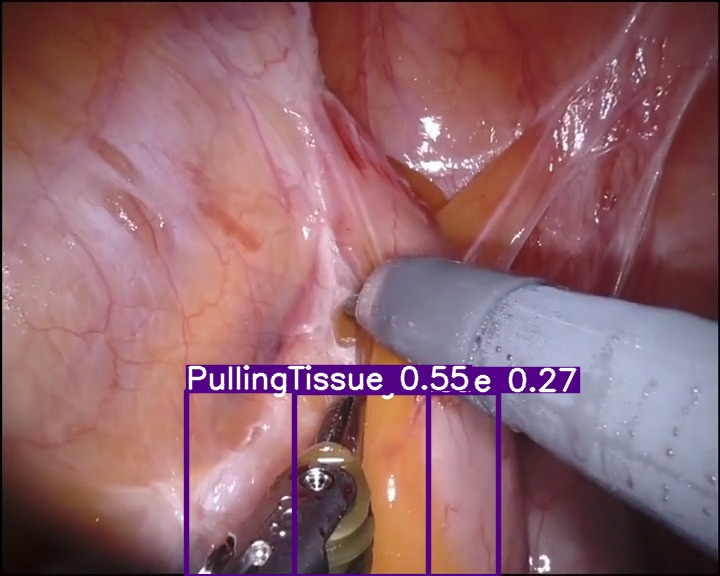

In [38]:
Image(filename='/content/yolov5/runs/detect/exp11/real3_frame_74.jpg', width=1000)

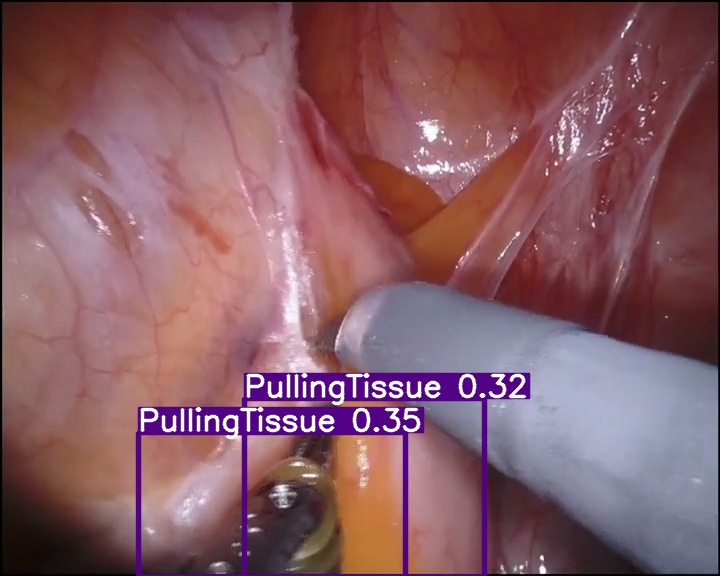

In [39]:
Image(filename='/content/yolov5/runs/detect/exp12/real3_frame_75.jpg', width=1000)

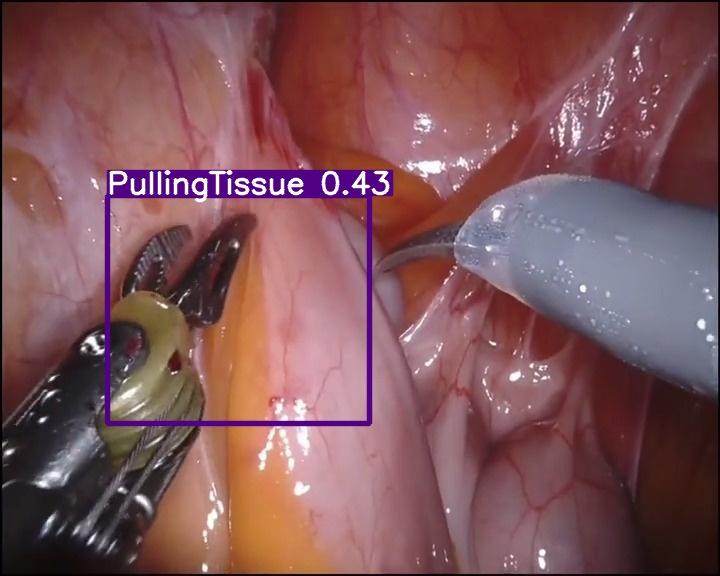

In [40]:
Image(filename='/content/yolov5/runs/detect/exp13/real3_frame_76.jpg', width=1000)

In [41]:
!python detect.py --source /content/yolov5/runs/train/exp/real3_frame_740.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/real3_frame_740.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/real3_frame_740.jpg: 512x640 Done. (0.021s)
Speed: 0.5ms pre-process, 20.7ms inference, 0.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp14


In [42]:
!python detect.py --source /content/yolov5/runs/train/exp/real3_frame_747.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/real3_frame_747.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/real3_frame_747.jpg: 512x640 1 PullingTissue, Done. (0.017s)
Speed: 0.5ms pre-process, 17.5ms inference, 1.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp15


In [43]:
!python detect.py --source /content/yolov5/runs/train/exp/real3_frame_749.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/real3_frame_749.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/real3_frame_749.jpg: 512x640 1 PullingTissue, Done. (0.018s)
Speed: 0.5ms pre-process, 18.1ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp16


In [44]:
!python detect.py --source /content/yolov5/runs/train/exp/real3_frame_753.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/real3_frame_753.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7066762 parameters, 0 gradients, 16.0 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/real3_frame_753.jpg: 512x640 Done. (0.020s)
Speed: 0.5ms pre-process, 20.3ms inference, 0.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp17


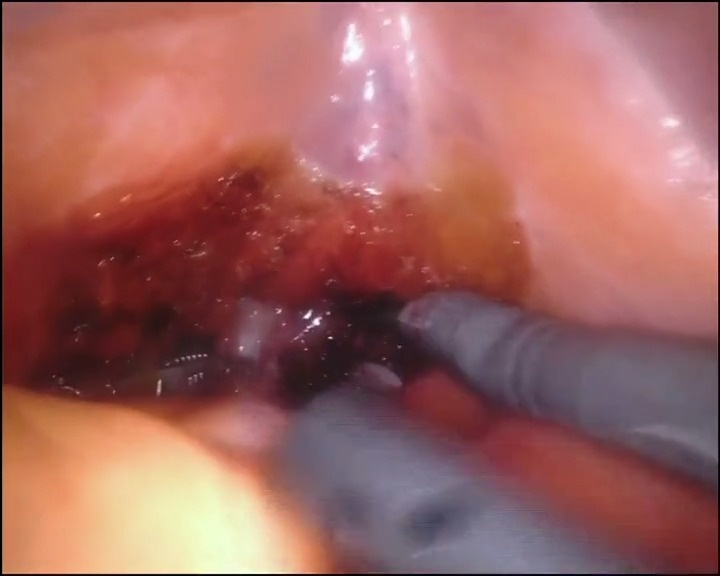

In [45]:
Image(filename='/content/yolov5/runs/detect/exp14/real3_frame_740.jpg', width=1000)

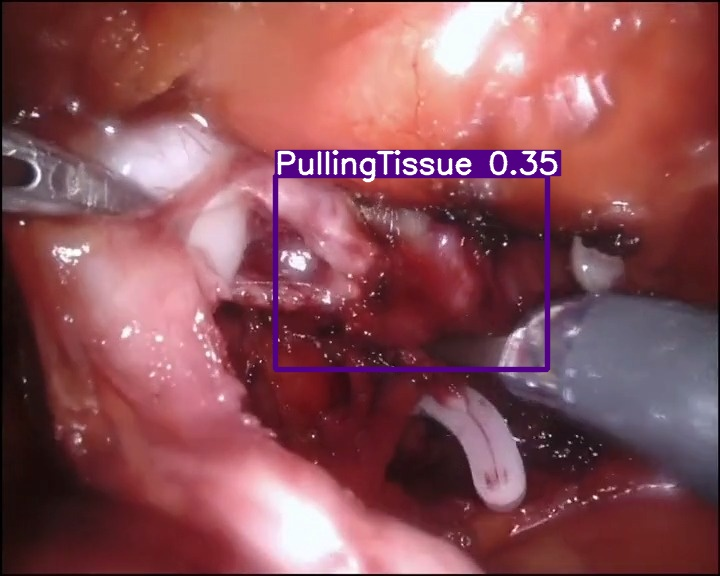

In [46]:
Image(filename='/content/yolov5/runs/detect/exp15/real3_frame_747.jpg', width=1000)

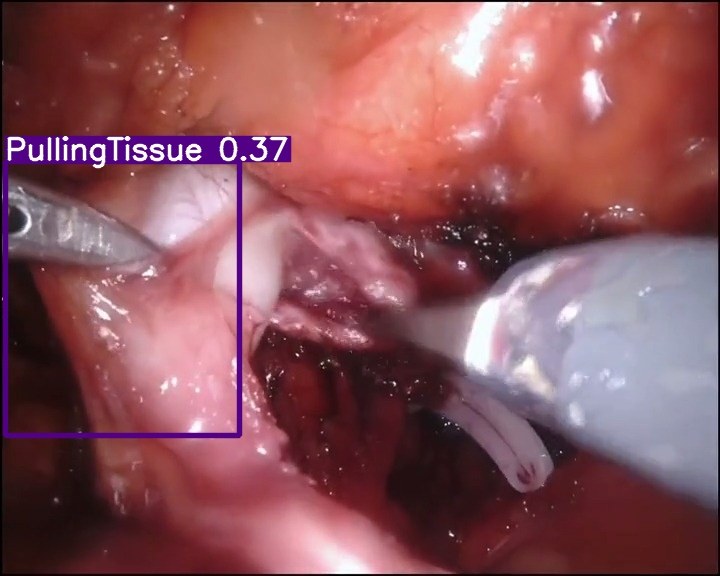

In [47]:
Image(filename='/content/yolov5/runs/detect/exp16/real3_frame_749.jpg', width=1000)

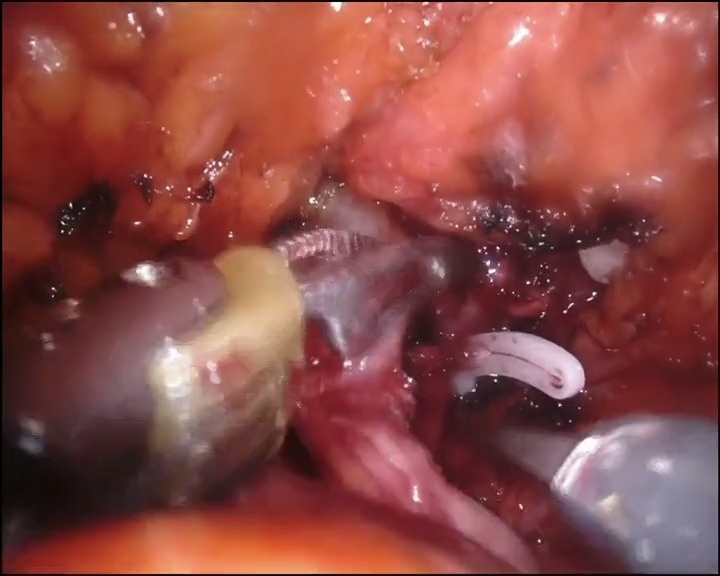

In [48]:
Image(filename='/content/yolov5/runs/detect/exp17/real3_frame_753.jpg', width=1000)

In [ ]:
from utils.plots import plot_results 
plot_results('/content/yolov5/yolov5/runs/train/exp7/results.csv') 